# Setup

## Imports

In [1]:
# Setup
import os
from utils.custom_transformers import ColumnSelector, SaveTransformer, NumericalTransformer, CategoricalTransformer
from IPython.display import Image

# Data Analysis
import pandas as pd
import numpy as np
from pandas_profiling import ProfileReport


#Scikit learn
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.compose import ColumnTransformer
from sklearn.model_selection import train_test_split
from sklearn.pipeline import make_pipeline, Pipeline, FeatureUnion
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.preprocessing import OneHotEncoder, MinMaxScaler
from sklearn.impute import SimpleImputer

## Configs

In [2]:
%matplotlib inline
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 200)

## Functions

In [3]:
def load_data(file_name, folder = "data"):
    df = pd.read_csv(os.path.join(folder, file_name))
    return df

def target_transformation(text):
    text = text.replace(" ", "").lower()
    if text == "yes" :
        return 1
    elif text == "no":
        return 0

# Data Analysis

## Data Load

In [4]:
df_original = load_data("train_data.csv","data")

In [ ]:
df_original.head()

## Exploratory Data Analysis

### Overall Analysis

In [296]:
df_original_report = ProfileReport(df_transformed)

In [297]:
df_original_report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [39]:
df_original.nunique()

admission_id                   81412
patient_id                     60069
race                              15
gender                             3
age                               10
weight                            10
admission_type_code                8
discharge_disposition_code        25
admission_source_code             17
time_in_hospital                  14
payer_code                        18
medical_specialty                 71
has_prosthesis                     2
complete_vaccination_status        3
num_lab_procedures               115
num_procedures                     7
num_medications                   73
number_outpatient                 39
number_emergency                  29
number_inpatient                  21
diag_1                           701
diag_2                           725
diag_3                           761
number_diagnoses                  16
blood_type                         8
hemoglobin_level                  77
blood_transfusion                  2
m

In [64]:
df_original.dtypes

admission_id                     int64
patient_id                       int64
race                            object
gender                          object
age                             object
weight                          object
admission_type_code            float64
discharge_disposition_code     float64
admission_source_code            int64
time_in_hospital                 int64
payer_code                      object
medical_specialty               object
has_prosthesis                    bool
complete_vaccination_status     object
num_lab_procedures             float64
num_procedures                   int64
num_medications                float64
number_outpatient                int64
number_emergency                 int64
number_inpatient                 int64
diag_1                          object
diag_2                          object
diag_3                          object
number_diagnoses                 int64
blood_type                      object
hemoglobin_level         

In [ ]:
df_original.isna().sum()

In [ ]:
df_original.corr()

In [ ]:
df_original_report

In [ ]:
df_original_filtered = df_original.copy()
df_original_filtered = df_original_filtered.drop_duplicates(subset=['patient_id'])

In [7]:
df_original['patient_id'].value_counts().head(25)

177571710    33
176455008    20
181219536    19
185418630    18
47286738     18
3320514      18
182320488    17
46397970     17
86281740     16
168857154    16
194781942    16
183502170    16
48023082     16
83398752     16
6802038      16
177363828    16
168697512    16
178944732    16
177579342    15
6962472      15
59807682     15
74193660     15
83234664     14
83434266     14
46796904     14
Name: patient_id, dtype: int64

In [114]:
df_original['discharge_disposition_code'].value_counts()

1.0     47854
3.0     11097
6.0     10244
18.0     2912
2.0      1690
22.0     1580
11.0     1312
5.0       936
25.0      793
4.0       650
7.0       506
23.0      324
13.0      314
14.0      294
28.0      106
8.0        85
15.0       51
24.0       40
9.0        18
17.0       12
16.0        7
19.0        5
10.0        5
27.0        4
12.0        2
Name: discharge_disposition_code, dtype: int64

### Data Transformation

In [26]:
categorical = ['readmitted','change','diabetesMed','has_prosthesis','blood_transfusion','diuretics','insulin','admission_source_code','discharge_disposition_code','admission_type_code','payer_code','complete_vaccination_status','blood_type','max_glu_serum','A1Cresult','age','race','gender','weight','diag_1','diag_2','diag_3','medical_specialty']
numerical = ['time_in_hospital','num_lab_procedures','num_procedures','num_medications','number_outpatient','number_emergency','number_inpatient','number_diagnoses','hemoglobin_level']
columns_features = categorical + numerical
columns_extra = [column for column in df_original.columns if column not in columns_features ]

cat_pipe = Pipeline([
    ('selector', ColumnSelector(categorical))
    ,('transformer',CategoricalTransformer(mininum_records =100))
    ,("save_to_csv_cat1", SaveTransformer(step="cat1"))
    #,('imputer', SimpleImputer(strategy='constant', fill_value='missing'))
    #,('encoder', OneHotEncoder(handle_unknown='ignore', sparse=False))
    #,("save_to_csv_cat2", Save(step="cat2"))
])

num_pipe = Pipeline([
    ('selector', ColumnSelector(numerical))
    ,('transformer',NumericalTransformer())
    ,("save_to_csv_num1", SaveTransformer(step="num1"))
    ,('imputer', SimpleImputer(strategy='median'))
    #,('scaler', MinMaxScaler())
    #,("save_to_csv_num2", Save(step="num2"))
])

extra_pipe = Pipeline([
    ('selector', ColumnSelector(columns_extra))
    #,('imputer', SimpleImputer(strategy='median'))
    #,('scaler', MinMaxScaler())
    #,("save_to_csv_num2", Save(step="num2"))
])

pre_processor = FeatureUnion([
    ('cat', cat_pipe)
    ,('num', num_pipe)
    ,('extra', extra_pipe)
])

pipeline = Pipeline([
    ('preprocessor', pre_processor)
    #,('model', GradientBoostingClassifier())
])

pipeline.fit(df_original)
df_transformed = pipeline.transform(df_original)

total_columns = np.append(columns_features, columns_extra)
df_transformed = pd.DataFrame(df_transformed, columns = total_columns)
dtypes_list =     {
    'readmitted':"Int64",
    'change':"Int64",
    'diabetesMed':"Int64",
    'has_prosthesis':"Int64",
    'blood_transfusion':"Int64",
    'diuretics':"Int64",
    'insulin':"Int64",
    'admission_source_code':"object",
    'discharge_disposition_code':"object",
    'admission_type_code':"object",
    'payer_code':"object",
    'complete_vaccination_status':"object",
    'blood_type':"object",
    'max_glu_serum':"object",
    'A1Cresult':"object",
    'age':"object",
    'race':"object",
    'gender':"object",
    'diag_1':"object",
    'diag_2':"object",
    'diag_3':"object",
    'medical_specialty':"object",
    'time_in_hospital':"Int64",
    'num_lab_procedures':"Int64",
    'num_procedures':"Int64",
    'num_medications':"Int64",
    'number_outpatient':"Int64",
    'number_emergency':"Int64",
    'number_inpatient':"Int64",
    'number_diagnoses':"Int64",
    'hemoglobin_level':"Float64",
    'admission_id':"Int64",
    'patient_id':"Int64",
    'weight':"object"
}
df_transformed = df_transformed.astype(dtypes_list)


TypeError: object cannot be converted to an IntegerDtype

In [298]:
df_transformed['readmitted'].value_counts()

0    72340
1     9072
Name: readmitted, dtype: Int64

In [122]:
df_transformed.groupby(['discharge_disposition_code']).mean()

,readmitted,change,diabetesMed,has_prosthesis,blood_transfusion,diuretics,insulin,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses,hemoglobin_level,admission_id,patient_id
discharge_disposition_code,,,,,,,,,,,,,,,,,,
admitted,0.388889,0.611111,0.888889,0.055556,0.222222,0.055556,0.666667,4.777778,47.0,1.166667,15.444444,0.333333,0.611111,1.444444,7.666667,14.027778,39180.166667,131488155.555556
discharged,0.113155,0.472076,0.778952,0.010591,0.1191,0.018558,0.555332,4.358091,42.927536,1.331767,15.981147,0.383745,0.202678,0.632175,7.43488,14.191461,40734.721336,112778332.646395
expired,0.0,0.348519,0.660592,0.014427,0.121488,0.018223,0.579347,4.764617,51.823083,1.936978,18.399393,0.373576,0.164768,0.791951,8.22779,14.208656,40275.651481,110938638.979499
hospice,0.052632,0.424342,0.726974,0.011513,0.138158,0.019737,0.634868,5.669408,46.769737,0.820724,16.090461,0.401316,0.184211,0.907895,8.386513,14.217763,40791.914474,120582255.447368
left_ama,0.134387,0.405138,0.725296,0.007905,0.12253,0.021739,0.575099,2.869565,45.337945,0.658103,12.626482,0.262846,0.630435,0.970356,7.110672,14.38498,40189.124506,119427887.189723
missing,0.119972,0.339102,0.665809,0.009355,0.11927,0.019878,0.335126,4.941534,42.40435,1.489242,15.803789,0.155519,0.06782,0.607577,6.846118,14.176333,40375.122778,32576602.392423
other,0.5,0.0,0.0,0.0,0.0,0.0,0.0,3.5,30.5,0.5,13.0,0.0,0.0,0.0,9.0,15.0,57010.5,98343576.0


In [118]:
df_transformed['discharge_disposition_code'].value_counts()

Discharged to home                                                                                           47854
Discharged/transferred to SNF                                                                                11097
Discharged/transferred to home with home health service                                                      10244
missing                                                                                                       4276
Discharged/transferred to another short term hospital                                                         1690
Discharged/transferred to another rehab fac including rehab units of a hospital .                             1580
Expired                                                                                                       1312
Discharged/transferred to another type of inpatient care institution                                           936
Discharged/transferred to ICF                                                   

In [ ]:
df_transformed_report = ProfileReport(df_transformed)
df_transformed_report

# Pipelines

## Custom Transformers

In [291]:
X, y = separate_target_variable(df_transformed)
X = X.drop(columns=['patient_id','admission_id'])
X = process_categorical_features(X)
y= y.astype('int')

In [292]:

from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor

model = DecisionTreeClassifier(
    criterion='entropy',
    random_state=101
)

model.fit(X, y)

DecisionTreeClassifier(criterion='entropy', random_state=101)

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.116911 to fit



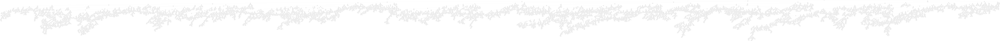

In [295]:
tree = visualize_tree(model, X.columns, ["negative_class", "positive_class"])
Image(tree)

In [294]:
feature_importances = pd.Series(data=model.feature_importances_, index=X.columns)
feature_importances.sort_values(ascending=False).head(50)

hemoglobin_level                            0.082659
num_lab_procedures                          0.080770
num_medications                             0.067822
time_in_hospital                            0.043108
number_inpatient                            0.034595
num_procedures                              0.028359
number_diagnoses                            0.027593
number_outpatient                           0.014988
number_emergency                            0.013155
diag_3_others                               0.011510
blood_type_o+                               0.011194
diag_1_others                               0.010583
insulin                                     0.010294
medical_specialty_missing                   0.010117
blood_type_a+                               0.009960
diag_2_others                               0.009860
change                                      0.009851
payer_code_mc                               0.009519
age_[60-70)                                 0.

In [288]:
import pandas as pd
import pydotplus
from sklearn.tree import (
    DecisionTreeClassifier,
    export_graphviz,
)
def separate_target_variable(data):
    X = data.copy()
    y = X.pop('readmitted')
    
    return X, y

def process_categorical_features(X):
    return pd.get_dummies(X)


def visualize_tree(clf, feature_names, class_names):
    dot_data = export_graphviz(
        clf,
        out_file=None,
        feature_names=feature_names,
        class_names=class_names,
    )

    graph = pydotplus.graph_from_dot_data(dot_data)
    return graph.create_png()



In [289]:
class CategoricalTransformer(BaseEstimator, TransformerMixin):
    
    def __init__(self, mininum_records=250):
        super().__init__()
        self.mininum_records = mininum_records
            
    def fit(self, X, y=None):
        _X = X.copy()
        
        query_min = "count > "+ str(self.mininum_records)
        
        for col in _X.columns:
            if col == 'admission_type_code' :
                list_values = _X['admission_type_code'].value_counts().reset_index(name="count").query(query_min)["index"]
                self.admission_type_code = [str(int(x)).lower() for x in list_values]
            elif col == 'discharge_disposition_code':
                list_values = _X['discharge_disposition_code'].value_counts().reset_index(name="count").query(query_min)["index"]
                self.discharge_disposition_code = [str(int(x)).lower() for x in list_values]
            elif col == 'admission_source_code':
                list_values = _X['admission_source_code'].value_counts().reset_index(name="count").query(query_min)["index"]
                self.admission_source_code = [str(int(x)).lower() for x in list_values]
            elif col == 'medical_specialty':
                list_values = _X['medical_specialty'].value_counts().reset_index(name="count").query(query_min)["index"]
                self.medical_specialty = [str(x).lower() for x in list_values]
            elif col == 'payer_code':
                list_values = _X['payer_code'].value_counts().reset_index(name="count").query(query_min)["index"]
                self.payer_code = [str(x).lower() for x in list_values]
            elif col == 'diag_1':
                list_values = _X['diag_1'].value_counts().reset_index(name="count").query(query_min)["index"]
                self.diag_1 = [str(x).lower() for x in list_values]
            elif col == 'diag_2':
                list_values = _X['diag_2'].value_counts().reset_index(name="count").query(query_min)["index"]
                self.diag_2 = [str(x).lower() for x in list_values]
            elif col == 'diag_3':
                list_values = _X['diag_3'].value_counts().reset_index(name="count").query(query_min)["index"]
                self.diag_3 = [str(x).lower() for x in list_values]

        return self

    def pre_process_text(self, obj):
        return str(obj).replace(" ","").lower()
    
    def bool_to_binary(self, obj):
        if obj == True:
            return 1
        elif obj == False:
            return 0
    
    def text_to_binary(self, obj):
        if obj == "yes" or obj == "ch"  :
            return 1
        elif obj == "no":
            return 0
        
    def handle_categories(self, obj, list_categories):
        if obj in list(list_categories):
            return str(obj)
        elif obj is None:
            return None
        else:
            return "others"
    
    def handle_missing_values(self, obj):
        if pd.isna(obj) or  str(obj).lower() in ("?","<na>","unknown/invalid","nan","none") :
            return None
        else :
            return obj
        
    def handle_invalid_categories(self, obj, invalid_categories):
        if obj in list(invalid_categories):
            return None
        else :
            return obj
    
    def create_diag_category(self, obj):
        if str(obj)[:1] in ("v","e"):
            return str(obj)[:1]
        elif obj:
            if float(obj) > 0 and float(obj) <= 139:
                return str('000-139')
            elif float(obj) >139  and float(obj) <= 239:
                return str('140-239')
            elif float(obj) > 239 and float(obj) <= 279:
                return str('240-279')
            elif float(obj) > 279 and float(obj) <= 289:
                return str('280-289')
            elif float(obj) > 289 and float(obj) <= 319:
                return str('290-319')
            elif float(obj) > 319 and float(obj) <= 389:
                return str('320-389')
            elif float(obj) > 389 and float(obj) <= 459:
                return str('390-459')
            elif float(obj) > 459 and float(obj) <= 519:
                return str('460-519')
            elif float(obj) > 519 and float(obj) <= 579:
                return str('520-579')
            elif float(obj) > 579 and float(obj) <= 629:
                return str('580-630')
            elif float(obj) > 629 and float(obj) <= 679:
                return str('630-679')
            elif float(obj) > 679 and float(obj) <= 709:
                return str('680-709')
            elif float(obj) > 709 and float(obj) <= 739:
                return str('710-739')         
            elif float(obj) > 739 and float(obj) <= 759:
                return str('740-759')
            elif float(obj) > 759 and float(obj) <= 779:
                return str('760-779')
            elif float(obj) > 779 and float(obj) <= 799:
                return str('780-799')
            elif float(obj) > 799 and float(obj) <= 999:
                return str('800-999')         
        else:
            return obj
        
    def transform(self, X, y=None):
        _X = X.copy()
        
        if 'diag_1' in _X.columns:
            values = _X['diag_1'].apply(self.pre_process_text)
            _X['diag_1_categories'] = values.apply(self.handle_missing_values)
            _X['diag_1_categories'] = _X['diag_1_categories'].apply(self.create_diag_category) 
        
        for _col in _X:     
            if _col in ['has_prosthesis','blood_transfusion']:
                _X[_col] = _X[_col].apply(self.bool_to_binary)
                
            elif _col in ['diuretics','insulin','change','diabetesMed','readmitted']:
                _X[_col] = _X[_col].apply(self.pre_process_text)
                _X[_col] = _X[_col].apply(self.text_to_binary)
                
            elif _col in ['gender','age','weight','complete_vaccination_status','blood_type','max_glu_serum','A1Cresult']:
                _X[_col] = _X[_col].apply(self.pre_process_text)
                _X[_col] = _X[_col].apply(self.handle_missing_values)
                
            elif _col in ['race']:
                transformation = {"caucasian" : "caucasian", "white" : "caucasian", "european" : "caucasian", "euro" : "caucasian",
                  "africanamerican" : "afroamerican", "black" : "afroamerican", "afroamerican" : "afroamerican",
                  "latino" : "hispanic", "hispanic" : "hispanic", 
                  "asian":"asian", 
                  "?" : "missing", "other":"other"}                
                _X[_col] = _X[_col].apply(self.pre_process_text)
                _X[_col] = _X[_col].map(transformation)
                _X[_col] = _X[_col].apply(self.handle_missing_values)
                
            elif _col in ['admission_type_code']:
                invalid_categories = ['5','6','8']
                _X[_col] = _X[_col].astype('Int64') 
                _X[_col] = _X[_col].apply(self.pre_process_text)
                _X[_col] = _X[_col].apply(self.handle_invalid_categories, args =([invalid_categories]))
                _X[_col] = _X[_col].apply(self.handle_missing_values)
                _X[_col] = _X[_col].apply(self.handle_categories, args = ([self.admission_type_code]))   
                
            elif _col in ['admission_source_code']:
                invalid_categories = ['9','15','17','20','21']
                _X[_col] = _X[_col].astype('Int64') 
                _X[_col] = _X[_col].apply(self.pre_process_text)
                _X[_col] = _X[_col].apply(self.handle_invalid_categories, args =([invalid_categories]))
                _X[_col] = _X[_col].apply(self.handle_missing_values)
                _X[_col] = _X[_col].apply(self.handle_categories, args = ([self.admission_source_code]))  
                
            elif _col in ['discharge_disposition_code']:
                invalid_categories = ['18','25','26']
                _X[_col] = _X[_col].astype('Int64') 
                _X[_col] = _X[_col].apply(self.pre_process_text)
                _X[_col] = _X[_col].apply(self.handle_invalid_categories, args =([invalid_categories]))
                _X[_col] = _X[_col].apply(self.handle_missing_values)
                _X[_col] = _X[_col].apply(self.handle_categories, args = ([self.discharge_disposition_code]))  
                
            elif _col in ['medical_specialty']:
                _X[_col] = _X[_col].apply(self.pre_process_text)
                _X[_col] = _X[_col].apply(self.handle_missing_values)
                _X[_col] = _X[_col].apply(self.handle_categories, args = ([self.medical_specialty]))  
                
            elif _col in ['payer_code']:
                _X[_col] = _X[_col].apply(self.pre_process_text)
                _X[_col] = _X[_col].apply(self.handle_missing_values)
                _X[_col] = _X[_col].apply(self.handle_categories, args = ([self.payer_code])) 
            
            elif _col in ['diag_1']:
                _X[_col] = _X[_col].apply(self.pre_process_text)
                _X[_col] = _X[_col].apply(self.handle_missing_values)
                _X[_col] = _X[_col].apply(self.handle_categories, args = ([self.diag_1])) 
        
            elif _col in ['diag_2']:
                _X[_col] = _X[_col].apply(self.pre_process_text)
                _X[_col] = _X[_col].apply(self.handle_missing_values)
                _X[_col] = _X[_col].apply(self.handle_categories, args = ([self.diag_2])) 
        
            elif _col in ['diag_3']:
                _X[_col] = _X[_col].apply(self.pre_process_text)
                _X[_col] = _X[_col].apply(self.handle_missing_values)
                _X[_col] = _X[_col].apply(self.handle_categories, args = ([self.diag_3])) 
        
        return _X

In [290]:
categorical = ['readmitted','change','diabetesMed','has_prosthesis','blood_transfusion','diuretics','insulin','admission_source_code','discharge_disposition_code','admission_type_code','payer_code','complete_vaccination_status','blood_type','max_glu_serum','A1Cresult','age','race','gender','weight','diag_1','diag_2','diag_3','medical_specialty']
numerical = ['time_in_hospital','num_lab_procedures','num_procedures','num_medications','number_outpatient','number_emergency','number_inpatient','number_diagnoses','hemoglobin_level']
new_columns = ['diag_1_categories']
columns_features = categorical + new_columns + numerical
columns_extra = [column for column in df_original.columns if column not in columns_features ]

cat_pipe = Pipeline([
    ('selector', ColumnSelector(categorical))
    ,('transformer',CategoricalTransformer(mininum_records = 500))
    ,("save_to_csv_cat1", SaveTransformer(step="cat1"))
    ,('imputer', SimpleImputer(missing_values = None,strategy='constant', fill_value='missing'))
    #,('encoder', OneHotEncoder(handle_unknown='ignore', sparse=False))
    #,("save_to_csv_cat2", Save(step="cat2"))
])

num_pipe = Pipeline([
    ('selector', ColumnSelector(numerical))
    ,('transformer',NumericalTransformer())
    ,("save_to_csv_num1", SaveTransformer(step="num1"))
    ,('imputer', SimpleImputer(strategy='median'))
    #,('scaler', MinMaxScaler())
    #,("save_to_csv_num2", Save(step="num2"))
])

extra_pipe = Pipeline([
    ('selector', ColumnSelector(columns_extra))
])

pre_processor = FeatureUnion([
    ('cat', cat_pipe)
    ,('num', num_pipe)
    ,('extra', extra_pipe)
])

pipeline = Pipeline([
    ('preprocessor', pre_processor)
    #,('model', GradientBoostingClassifier())
])

pipeline.fit(df_original)
df_transformed = pipeline.transform(df_original)

total_columns = np.append(columns_features, columns_extra)
df_transformed = pd.DataFrame(df_transformed, columns = total_columns)
dtypes_list =     {
    'readmitted':"Int64",
    'change':"Int64",
    'diabetesMed':"Int64",
    'has_prosthesis':"Int64",
    'blood_transfusion':"Int64",
    'diuretics':"Int64",
    'insulin':"Int64",
    'admission_source_code':"object",
    'discharge_disposition_code':"object",
    'admission_type_code':"object",
    'payer_code':"object",
    'complete_vaccination_status':"object",
    'blood_type':"object",
    'max_glu_serum':"object",
    'A1Cresult':"object",
    'age':"object",
    'race':"object",
    'gender':"object",
    'diag_1':"object",
    'diag_2':"object",
    'diag_3':"object",
    'medical_specialty':"object",
    'diag_1_categories': "object",
    'time_in_hospital':"Int64",
    'num_lab_procedures':"Int64",
    'num_procedures':"Int64",
    'num_medications':"Int64",
    'number_outpatient':"Int64",
    'number_emergency':"Int64",
    'number_inpatient':"Int64",
    'number_diagnoses':"Int64",
    'hemoglobin_level':"Float64",
    'admission_id':"Int64",
    'patient_id':"Int64",
    'weight':"object"
}
df_transformed = df_transformed.astype(dtypes_list)



In [265]:
df_original['diag_1'].value_counts().head(100)

428       5429
414       5270
786       3232
410       2914
486       2776
427       2218
491       1811
715       1691
780       1620
682       1612
434       1605
996       1562
276       1530
250.8     1354
38        1352
599       1254
584       1242
250.6      958
V57        949
518        900
820        885
493        862
577        833
435        798
562        785
574        785
296        713
250.13     710
250.7      702
560        678
440        667
998        636
433        627
722        617
250.02     546
578        532
250.11     509
507        481
789        455
453        444
530        428
403        409
8          401
535        359
415        358
402        358
295        353
724        349
162        348
250.82     340
997        330
250.12     329
458        327
278        307
285        301
733        299
401        286
558        286
482        283
592        283
590        264
197        256
824        255
153        250
280        250
250.1      244
569       

In [282]:
df_transformed['diag_1_categories'].value_counts()

390-459    24193
240-279     9257
460-519     8316
520-579     7368
780-799     6137
800-999     5593
580-630     4052
710-739     3956
140-239     2762
000-139     2200
680-709     2000
290-319     1804
v           1309
320-389      975
280-289      874
630-679      557
740-759       42
missing       16
e              1
Name: diag_1_categories, dtype: int64

In [278]:
df_transformed

,diag_1_categories,readmitted,change,diabetesMed,has_prosthesis,blood_transfusion,diuretics,insulin,admission_source_code,discharge_disposition_code,admission_type_code,payer_code,complete_vaccination_status,blood_type,max_glu_serum,A1Cresult,age,race,gender,weight,diag_1,diag_2,diag_3,medical_specialty,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses,hemoglobin_level,admission_id,patient_id
0,0,0,1,0,0,0,0,1,1,3,missing,complete,a+,missing,missing,[50-60),caucasian,male,missing,others,250.6,others,missing,710-739,1.0,24.0,3.0,9.0,0.0,0.0,0.0,5.0,14.5,0,199042938
1,1,0,0,0,0,0,0,7,1,2,mc,complete,b+,missing,>7,[80-90),caucasian,male,missing,276,others,others,emergency/trauma,240-279,3.0,50.0,0.0,8.0,0.0,0.0,1.0,9.0,15.7,1,91962954
2,0,1,1,0,0,0,1,7,1,1,md,complete,o+,missing,missing,[60-70),caucasian,female,missing,414,others,250,missing,390-459,5.0,43.0,6.0,28.0,0.0,0.0,0.0,6.0,13.0,2,109707084
3,0,0,1,0,0,0,0,missing,1,missing,missing,complete,ab-,missing,>8,[70-80),afroamerican,female,missing,577,585,250,missing,520-579,2.0,58.0,5.0,8.0,0.0,1.0,1.0,9.0,13.5,3,157495374
4,0,0,0,0,0,0,0,7,22,1,mc,complete,a+,missing,missing,missing,caucasian,female,missing,others,others,others,missing,520-579,12.0,56.0,1.0,16.0,0.0,0.0,2.0,8.0,13.0,4,82692360
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
81407,0,1,1,0,0,0,1,7,others,1,md,complete,o+,missing,missing,[60-70),caucasian,male,missing,486,496,others,missing,460-519,2.0,64.0,0.0,22.0,0.0,0.0,3.0,5.0,15.4,81407,80746578
81408,0,1,1,0,0,0,1,7,6,1,cp,complete,o+,missing,missing,[70-80),afroamerican,female,missing,440,401,276,internalmedicine,390-459,8.0,62.0,2.0,19.0,0.0,0.0,1.0,9.0,12.8,81408,221853996
81409,1,0,0,0,0,0,0,7,22,1,missing,complete,b+,missing,missing,[60-70),afroamerican,female,missing,others,403,250.6,missing,800-999,5.0,1.0,2.0,14.0,0.0,0.0,0.0,9.0,13.0,81409,104846580
81410,0,0,1,0,1,0,0,2,1,3,missing,complete,ab+,missing,missing,[50-60),caucasian,female,missing,996,others,250,missing,800-999,1.0,30.0,1.0,10.0,0.0,0.0,0.0,7.0,13.3,81410,229820346
